# XRD with NMF trial

Need to get a better segmentation of the different crystallographic phases before we can register with microscopy images. Let's try blind NMF. 

%pip install h5py

In [1]:
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import h5py
import scipy.signal as ssg
import skimage.exposure as ske
import os
import re
import matplotlib.cm as cm
import maxrf4u as mx
import pickle
from matplotlib.patches import Rectangle 
import sklearn.decomposition as skd 
from IPython.display import SVG 

In [2]:
os.chdir('..')

In [5]:
#!tree

## Our favorite sample `IvdW_1038646_1`

Our colleagues in Grenoble scanned three paint samples. 

In [3]:
h5_files = glob('../**/*.h5', recursive=True)
for i, fn in enumerate(h5_files): 
    print(f'[{i}] {fn}')

[0] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/raw/XRD/IvdW_0333329_01/IvdW_0333329_01_roi91399_107460/IvdW_0333329_01_roi91399_107460.h5
[1] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/raw/XRD/IvdW_1038646_1/IvdW_1038646_1_roi91400_107461/IvdW_1038646_1_roi91400_107461.h5
[2] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/raw/XRD/IvdW_90_12_X5/IvdW_90_12_X5_roi91398_107459/IvdW_90_12_X5_roi91398_107459.h5
[3] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/XRD/IvdW_0333329_01/IvdW_0333329_01_roi91399_107460/IvdW_0333329_01_roi91399_107460.h5
[4] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/XRD/IvdW_1038646_1/IvdW_1038646_1_roi91400_107461/IvdW_1038646_1_roi91400_107461.h5
[5] ../2024-827_Mondriaan-micro-XRD-met-Inez/data/XRD/IvdW_90_12_X5/IvdW_90_12_X5_roi91398_107459/IvdW_90_12_X5_roi91398_107459.h5


In [4]:
favorite = 'IvdW_1038646_1'

In [7]:
fh = h5py.File(h5_files[1], mode='r') 

In [8]:
list_of_names = []
fh.visit(list_of_names.append)
list_of_names

['1.1',
 '1.1/eiger_average',
 '1.1/eiger_average/average',
 '1.1/eiger_average/average/2th',
 '1.1/eiger_average/average/average_intensity',
 '1.1/eiger_average/average/reference_hydrocerussite',
 '1.1/eiger_diffmap',
 '1.1/eiger_diffmap/configuration',
 '1.1/eiger_diffmap/configuration/data',
 '1.1/eiger_diffmap/configuration/type',
 '1.1/eiger_diffmap/dim0',
 '1.1/eiger_diffmap/dim1',
 '1.1/eiger_diffmap/dim2',
 '1.1/eiger_diffmap/mask_file',
 '1.1/eiger_diffmap/offset',
 '1.1/eiger_diffmap/program',
 '1.1/eiger_diffmap/result',
 '1.1/eiger_diffmap/result/2th',
 '1.1/eiger_diffmap/result/intensity',
 '1.1/eiger_diffmap/result/map',
 '1.1/eiger_integrate',
 '1.1/eiger_integrate/configuration',
 '1.1/eiger_integrate/configuration/data',
 '1.1/eiger_integrate/configuration/type',
 '1.1/eiger_integrate/integrated',
 '1.1/eiger_integrate/integrated/2th',
 '1.1/eiger_integrate/integrated/intensity',
 '1.1/eiger_integrate/integrated/points',
 '1.1/eiger_integrate/program',
 '1.1/eiger_inte

In [9]:
intensity = np.array(fh['1.1/eiger_diffmap/result/intensity']) 
x = np.array(fh['1.1/eiger_integrate/integrated/2th'])

intensity = intensity.transpose([1, 0, 2]) #rotate 90 degrees to match microscopy images
intensity.shape

(310, 160, 1400)

In [10]:
x.min(), x.max()

(0.33699664947841473, 55.42159941911291)

Let's take a look at the sum map of our favorite sample. 

In [11]:
sum_map = np.sum(intensity, axis=2)
sum_map.shape

(310, 160)

Text(0.5, 1.0, 'Intensity sum map of IvdW_1038646_1')

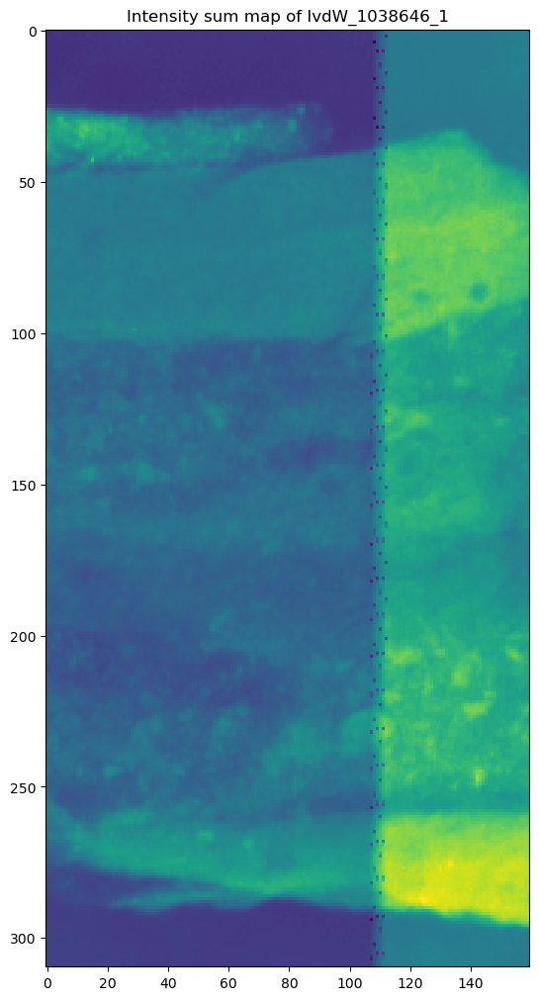

In [12]:
fig, ax = plt.subplots(figsize=[8, 10], layout='constrained')
ax.imshow(sum_map)
ax.set_title(f'Intensity sum map of {favorite}')

Note the overall discontinuity at x = 110. 

## Baseline intermezzo (done)

Let's explore the discontinuity in our favorite sample a bit further. 

Text(0.5, 1.0, 'discontinuity in IvdW_1038646_1')

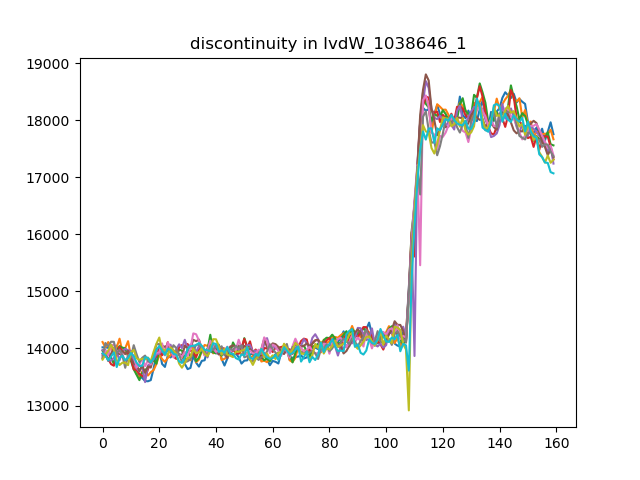

In [321]:
fig, ax = plt.subplots()
for i in range(70, 80):
    ax.plot(sum_map[i])

ax.set_title(f'discontinuity in {favorite}')

Mm, do I need to correct this first? 

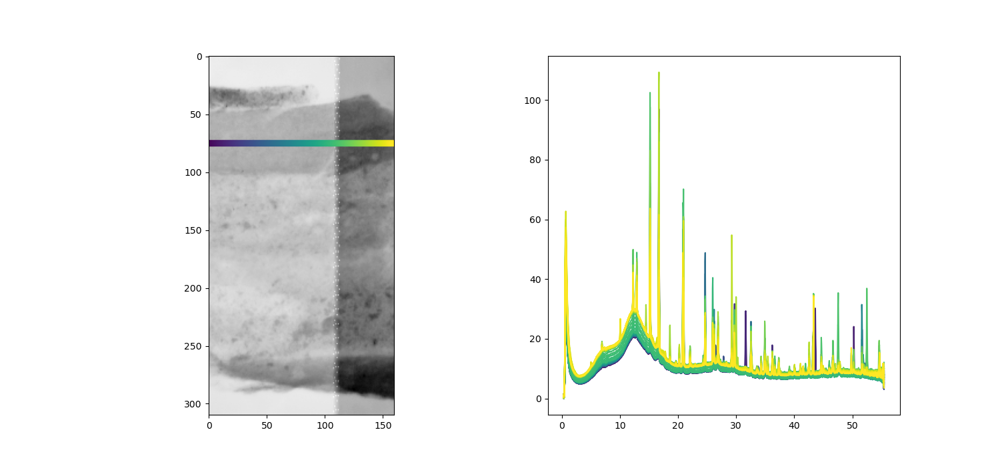

In [331]:
fig, axs = plt.subplots(ncols=2, figsize=[15, 7])

ax1, ax2 = axs.flatten()

h, w = intensity.shape[0:2]
colors = cm.viridis(np.linspace(0, 1, w))

ax1.imshow(sum_map, cmap='Greys')
ax1.scatter(range(w), 75*np.ones(w), color=colors)

for i in range(w): 
    ax2.plot(x, intensity[75, i], color=colors[i])

In [27]:
%matplotlib widget

Ok, let's use my `maxrf4u` homemade rolling ball baseline filter. 

In [418]:
spectrum_left = intensity[75, 100]
baseline = mx.hotmax._baseline(x, spectrum_left, radius=10)

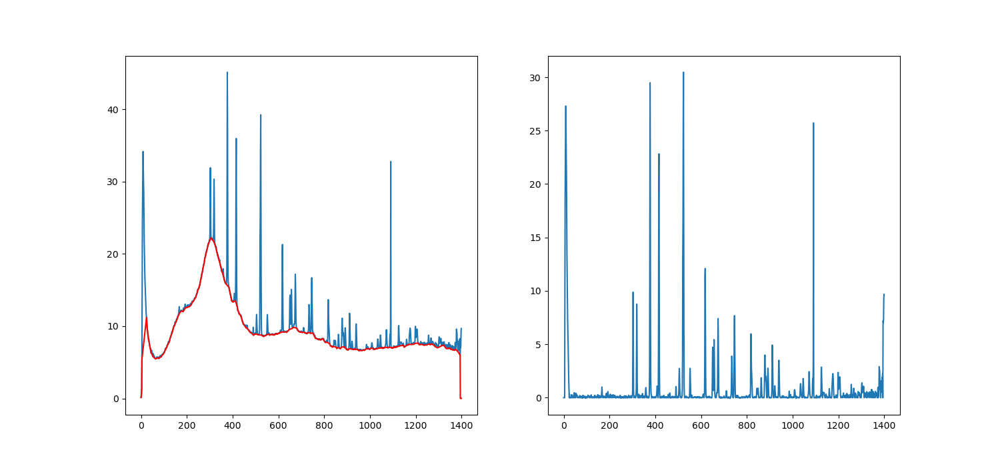

In [424]:
fig, axs = plt.subplots(ncols=2, sharex=True, figsize=[15, 7])
ax1, ax2 = axs.flatten()
ax1.plot(spectrum_left)
ax1.plot(baseline, c='r')
ax2.plot(spectrum_left - baseline)

In [171]:
h, w, d = intensity.shape

intensity_flat = intensity.reshape([h*w, d])
intensity_flat.shape

(49600, 1400)

In [47]:
baselines_flat = [] 

n = len(intensity_flat)

for i, s in enumerate(intensity_flat): 
    print(f'{i}/{n - 1}', end='\r')
    
    baseline = mx.hotmax._baseline(x, s, radius=10)
    baselines_flat.append(baseline)

In [51]:
baselines = np.array(baselines_flat).reshape([h, w, d])

In [48]:
!ls

data  docs  notebooks  viz


In [52]:
with open('data/interim/IvdW_1038646_1_baselines.pkl', 'wb') as fh: 
    pickle.dump(baselines, fh)

## Cube with baseline correction

In [13]:
# Load from file
with open('data/interim/IvdW_1038646_1_baselines.pkl', 'rb') as fh:
    baselines = pickle.load(fh)

Let's see if a baseline corrected cube is working for us...

In [14]:
xrd_cube = intensity - baselines
h, w, d = xrd_cube.shape
xrd_ymax = np.max(xrd_cube.reshape([-1, d]), axis=0)
xrd_ysum = np.sum(xrd_cube.reshape([-1, d]), axis=0)
xrd_summap = np.sum(xrd_cube, axis=2)

In [15]:
plt.close('all')

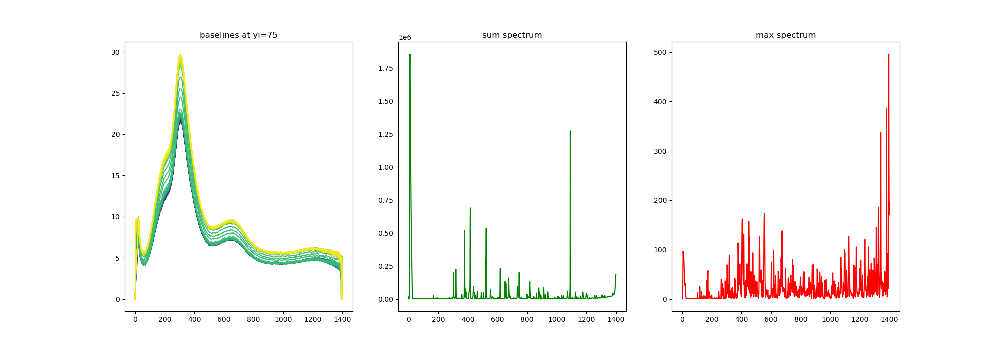

In [18]:
fig, axs = plt.subplots(ncols=3, sharex=True, figsize=[20, 7])

ax1, ax2, ax3 = axs.flatten()

colors = cm.viridis(np.linspace(0, 1, w))

for i in range(w): 
    ax1.plot(baselines[5, i], color=colors[i])
    #ax2.plot(xrd_cube[5, i], color=colors[i])
    #ax2.plot(xrd_ymax, color='violet')
    #ax2.scatter(idxs, xrd_ymax[idxs])

ax1.set_title('baselines at yi=75')

ax2.plot(xrd_ysum, c='g')
ax2.set_title('sum spectrum')

ax3.plot(xrd_ymax, c='r')
ax3.set_title('max spectrum');

In [17]:
%matplotlib widget

Here is our new baseline corrected sum map. We can still see a discontinuity, but this seems no longer to be a problem. 

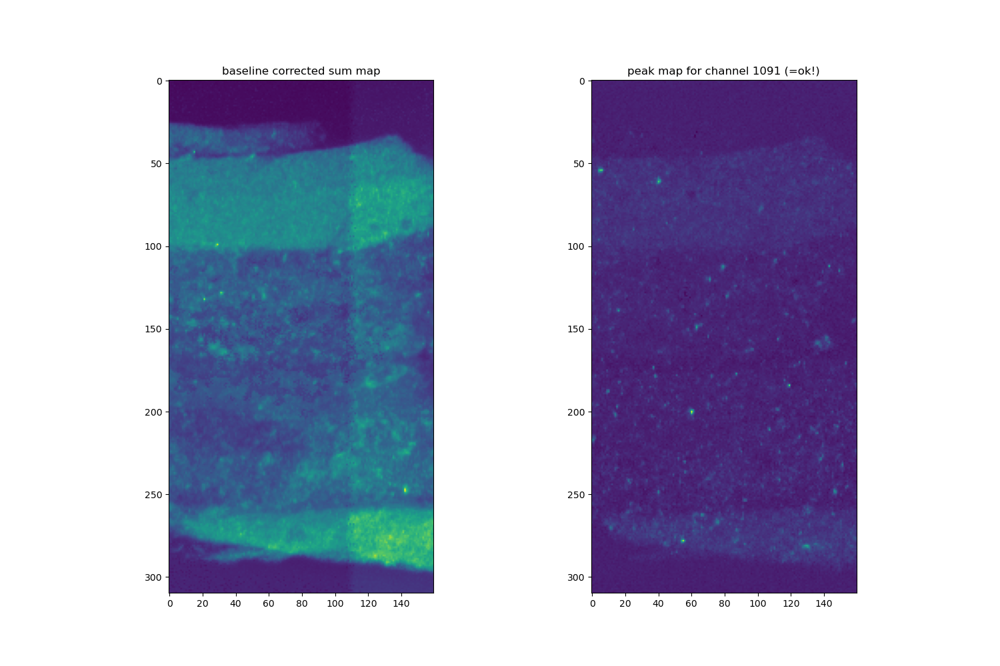

In [19]:
fig, axs = plt.subplots(ncols=2, figsize=[15, 10])
ax1, ax2 = axs.flatten()
ax1.imshow(xrd_summap)
ax1.set_title('baseline corrected sum map')
ax2.imshow(xrd_cube[:,:, 1091])
ax2.set_title('peak map for channel 1091 (=ok!)');


## Non-negative Matrix Factorization 

Ok, let's go!

In [20]:
xrd_cube.shape

(310, 160, 1400)

In [21]:
xrd_flat = xrd_cube.reshape([-1, d])
xrd_ysum = np.sum(xrd_flat, axis=0)

In [22]:
xrd_flat = xrd_cube.reshape([-1, d])
# zero out low angles
xrd_flat[:,0:30] = 0
# and this funny peak turns out to be ok after all
# xrd_flat[:,1090:1093] = 0
xrd_flat = xrd_flat - xrd_flat.min()# shift a bit to avoid negative numbers

In [23]:
n_components = 30 

In [24]:
%%time 
H, W, n_iter = skd.non_negative_factorization(xrd_flat, n_components=n_components, max_iter=1000)

CPU times: user 20min 13s, sys: 13min 59s, total: 34min 12s
Wall time: 1min 5s


In [25]:
print(f'H.shape: {H.shape}\nW.shape: {W.shape}\nn_iter: {n_iter}')

H.shape: (49600, 30)
W.shape: (30, 1400)
n_iter: 453


In [26]:
H_maps = H.reshape([h, w, n_components])
H_maps = H_maps.transpose(2, 0, 1)

H_pts = np.array([list(np.argwhere(m == m.max()).flatten()) for m in H_maps])

In [27]:
W.shape

(30, 1400)

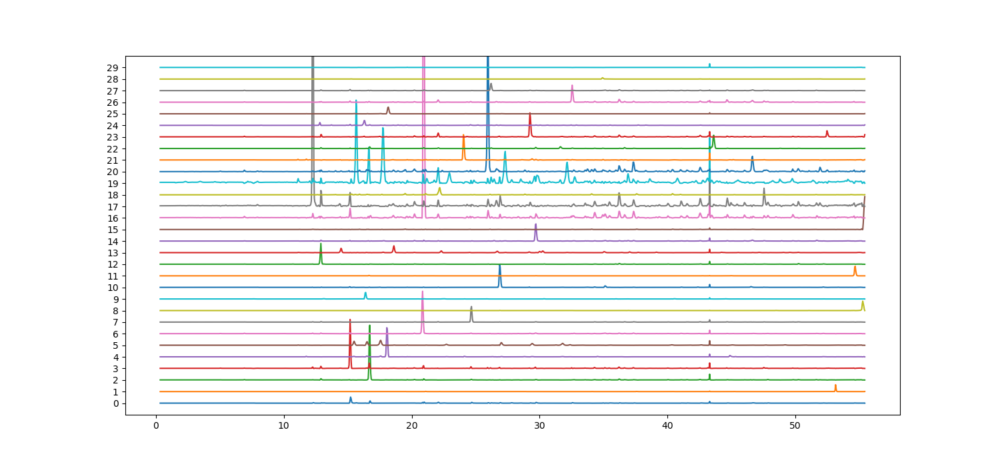

In [28]:
fig, ax = plt.subplots(figsize=[15, 7])

yticks = []
ytick_labels = []
ax.set_ylim(-100, 100*30)
for i, W_i in enumerate(W): 
    yticks.append(100*i)
    ytick_labels.append(i)
    ax.plot(x, W_i+100*i, label=i) 

ax.set_yticks(yticks)
ax.set_yticklabels(ytick_labels);


In [25]:
%matplotlib widget

In [25]:
plt.close('all')

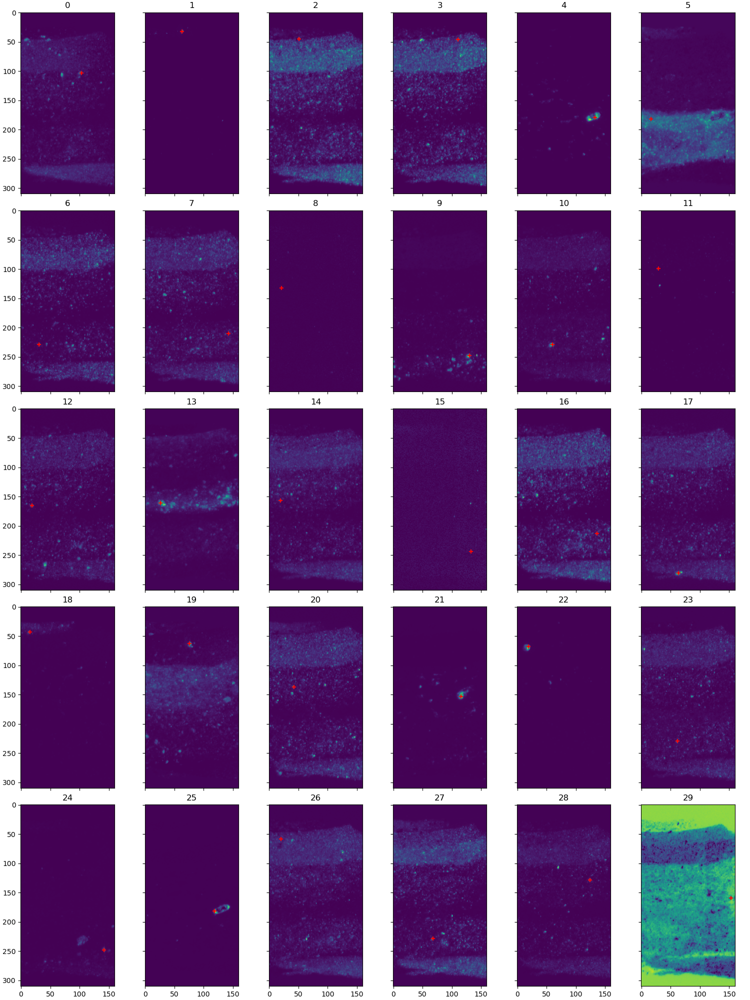

In [29]:
fig, axs = plt.subplots(ncols=6, nrows=5, figsize=[15, 20], sharex=True, sharey=True, layout='constrained')
axs = axs.flatten()

for i, ax in enumerate(axs): 
    #ax.imshow(ske.equalize_hist(H_maps[i]))
    ax.imshow(H_maps[i])#, vmax=0.5*H_maps[i].max())
    ax.set_title(i)
    y_i, x_i = H_pts[i]
    ax.scatter(x_i, y_i, color='r', marker='+')

## Image registration (front versus back)

Most interesting! It is clear that a single paint layer can contain a large number of crystal phases. With these high contrast images we are now in a better position to register with our microscopy images. Perhaps our best image is the polypol map. So let's export this.  

In [390]:
SVG('data/raw/microscopy/1038646-1/1038646-1_registration.svg')

## Matching with cif data 

Although we downloaded the complete COD database, I am still struggling to create a table or database to search from. For now, let's work with the set of unique crystal structures downloaded from the AMSCD database. See notebook 07. And create an overview of all diffractograms. 

In [30]:
from glob import glob
from pymatgen.core import Structure
from pymatgen.analysis.diffraction.xrd import XRDCalculator
import matplotlib.pyplot as plt 
import numpy as np 
import polars as pl
import os
pl.Config.set_tbl_rows(-1);

In [31]:
unique_cif_files = ['Lanarkite_0010717.cif',
 'Pb3O2(CO3)\r_0014552.cif',
 'Anglesite_0000665.cif',
 'Calcite_0000098.cif',
 'Thenardite_0005113.cif',
 'CadmiumOxalate_2012182.cif',
 'Shannonite_0014550.cif',
 'Glikinite_0020988.cif',
 'Sphalerite_0000110.cif',
 'Vaterite_0004854.cif',
 'CdCl2_0011804.cif',
 'Na2 O3 S\r_0017434.cif',
 'CadmiumChlorideHydrated_2106702.cif',
 'Magnesite_0000099.cif',
 'Sclarite_01317.cif',
 'Hydrocerussite_0009160.cif',
 'Pb3O2(CO3)_0014552.cif',
 'Wurtzite-2H_0010082.cif',
 'Huntite_0001006.cif',
 'cadmiumHydroxyChloride_1010263.cif',
 'Otavite_0000103.cif',
 'Dolomite_0000086.cif',
 'CdCl2\r_0011804.cif',
 'CadmiumHydroxySulphate_2107256.cif',
 'Greenockite_0011540.cif',
 'CadmiumSulphateMonohydrated_2241132.cif',
 'Na2 O4 S\r_0017433.cif',
 'Na2 O3 S_0017434.cif',
 'Hawleyite_0000070.cif',
 'Baryte_0000164.cif',
 'Zincite_0005203.cif',
 'Wurtzite-4H_0005544.cif',
 'Wurtzite-15R_0015414.cif',
 'CadmiumSulphateHydroxyHydrated_1525852.cif',
 'Na2 O4 S_0017433.cif',
 'CadmiumSulphiteHydrated_1541695.cif',
 'CadmiumSulphate_1533737.cif',
 'Wurtzite-10H_0000088.cif',
 'Scotlandite_0015703.cif',
 'Wurtzite_0015179.cif',
 'Zinkosite_0009208.cif',
 'Barite_0000163.cif',
 'Wurtzite-6H_0000115.cif',
 'CadmiumChlorideHydrated25_2106551.cif',
 'Cerussite_0006304.cif',
 'Wurtzite-8H_0000089.cif',
 '(CdSO4)3(H2O)8_1010534.cif',
 'Aragonite_0000233.cif']

Let's try to parse the structures for each unique cif file. 

In [32]:
prefix = 'data/AMCSD-data/amscd-cif-files/'

In [33]:
cif_files = [f'{prefix}{cf}' for cf in unique_cif_files]

structures = []
formulas = []
cif_nums = []
names = []
for cf in cif_files: 
    #print(f'Parsing: {cf}')
    try: 
        s = Structure.from_file(cf)
        structures.append(s)
        f = s.alphabetical_formula
        formulas.append(f)
        n = os.path.basename(cf)
        cif_nums.append(n)
        names.append(re.split('_', os.path.basename(cf))[0])
    except: 
        print(f'Error parsing: {cf}') 

df = pl.DataFrame({'formula': formulas, 'cif': cif_nums, 'name': names})
df.with_row_index()

/home/frank/.config/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/pymatgen/core/structure.py:3087: UserWarning: Issues encountered while parsing CIF: 2 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/home/frank/.config/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/pymatgen/core/structure.py:3087: UserWarning: Issues encountered while parsing CIF: 5 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  struct = parser.parse_structures(primitive=primitive)[0]
/home/frank/.config/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/pymatgen/io/cif.py:1312: UserWarning: Missing elements H from PMG structure composition
  if struct := self._get_structure(data, primitive, symmetrized, check_occu=check_occu):
/home/frank/.config/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/pymatgen/core/structure.py:3087: UserWarn

index,formula,cif,name
u32,str,str,str
0,"""O20 Pb8 S4""","""Lanarkite_0010717.cif""","""Lanarkite"""
1,"""C8 O40 Pb24""","""Pb3O2(CO3) _0014552.cif""","""Pb3O2(CO3) """
2,"""O16 Pb4 S4""","""Anglesite_0000665.cif""","""Anglesite"""
3,"""C6 Ca6 O18""","""Calcite_0000098.cif""","""Calcite"""
4,"""Na16 O32 S8""","""Thenardite_0005113.cif""","""Thenardite"""
5,"""C4 Cd2 O8""","""CadmiumOxalate_2012182.cif""","""CadmiumOxalate"""
6,"""C4 O16 Pb8""","""Shannonite_0014550.cif""","""Shannonite"""
7,"""O18 S4 Zn6""","""Glikinite_0020988.cif""","""Glikinite"""
8,"""S4 Zn4""","""Sphalerite_0000110.cif""","""Sphalerite"""


In [42]:
df.write_excel('lijstje.xls')

In [43]:
!ls

data  dataframe.xlsx  docs  lijstje.xls  notebooks  viz


In [34]:
n_structures = len(structures)
n_structures

48

In [35]:
wavelength = 9.510908054342373e-1 # as reported in json AND CONVERTED TO Angstroms!!! 
#alpha = 1.01
alpha = 1
patterns = [XRDCalculator(wavelength=wavelength * alpha).get_pattern(s) for s in structures]

In [36]:
W.shape

(30, 1400)

Text(0.5, 1.0, 'Zincite')

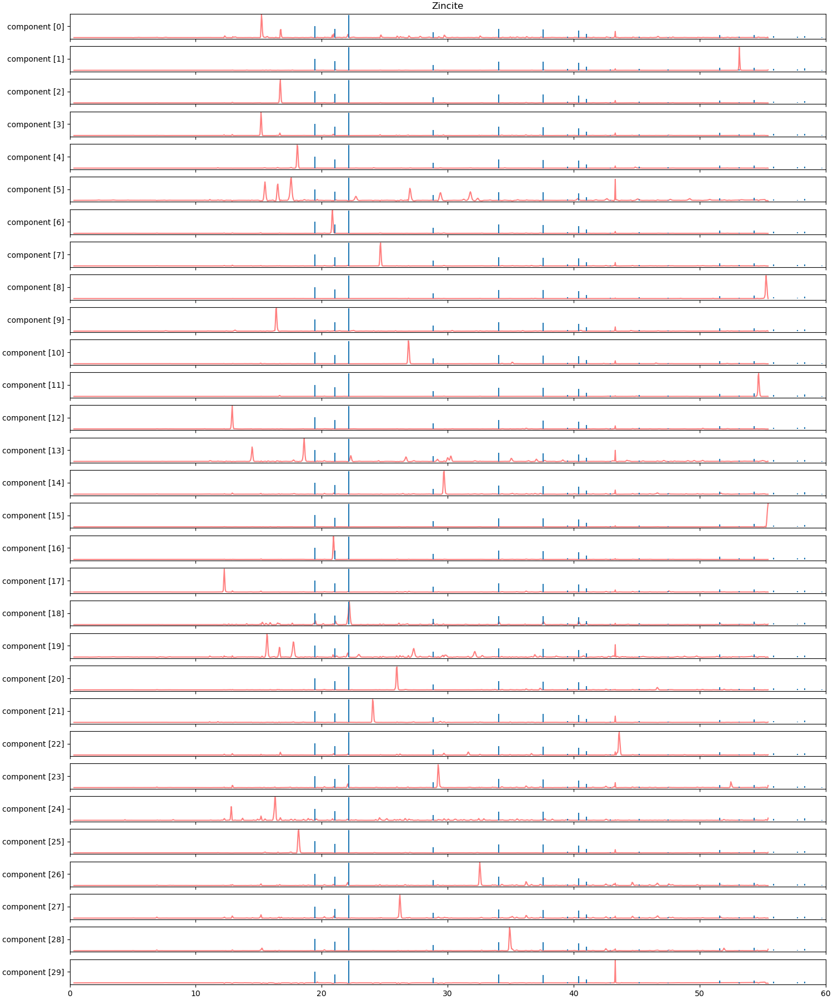

In [37]:
n = 30

n_components = len(W)

fig, axs = plt.subplots(nrows=n_components, figsize=[15, 18], layout='constrained', sharex=True)

axs = axs.flatten()

for i, [ax, w] in enumerate(zip(axs, W)):

    ax.plot(x, 100* w / max(w), color='r', alpha=0.5)
    ax.vlines(patterns[n].x, np.zeros_like(patterns[n].y), patterns[n].y)
    ax.set_xlim(0, 60)
    ax.set_yticks([50])
    ax.set_yticklabels([f'component [{i}]'])

axs[0].set_title(names[n])

Comparison with AMCDS diffraction data:

Conclusion is that NMF component 5 corresponds with compressed Greenockite.   

## Intermezzo with CdCO3 

In [173]:
CdCO3_amcds_cif_files = glob('./data/raw/XRD/AMCSD-data/CdCO3-variations/*.cif')
CdCO3_amcds_cif_files

['./data/raw/XRD/AMCSD-data/CdCO3-variations/Otavite_0000103.cif',
 './data/raw/XRD/AMCSD-data/CdCO3-variations/Otavite_0004324.cif',
 './data/raw/XRD/AMCSD-data/CdCO3-variations/Otavite_0004339.cif',
 './data/raw/XRD/AMCSD-data/CdCO3-variations/Otavite_0018091.cif']

In [174]:
structures = []
formulas = []
cif_nums = []
for cf in CdCO3_amcds_cif_files: 
    #print(f'Parsing: {cf}')
    try: 
        s = Structure.from_file(cf)
        structures.append(s)
        f = s.alphabetical_formula
        formulas.append(f)
        n = os.path.basename(cf)
        cif_nums.append(n)
    except: 
        print(f'Error parsing: {cf}') 

df = pl.DataFrame({'formula': formulas, 'cif': cif_nums})
df.with_row_index()

index,formula,cif
u32,str,str
0,"""C6 Cd6 O18""","""Otavite_0000103.cif"""
1,"""C6 Cd6 O18""","""Otavite_0004324.cif"""
2,"""C6 Cd6 O18""","""Otavite_0004339.cif"""
3,"""C2 Cd2 O6""","""Otavite_0018091.cif"""


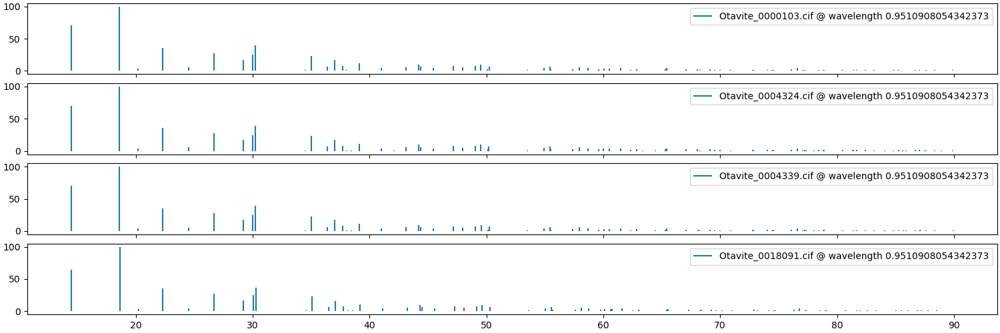

In [178]:
wavelength = 9.510908054342373e-1 # reported in json AND CONVERTED TO Angstroms!!! 

ptrns = []
for s in structures: 
    ptrn = XRDCalculator(wavelength=wavelength).get_pattern(s)
    ptrns.append(ptrn) 
    
n_ptrns = len(ptrns)
fig, axs = plt.subplots(nrows=n_ptrns, figsize=[15, 5], sharex=True, layout='constrained')
axs = axs.flatten()

for ax, ptrn, cif in zip(axs, ptrns, cif_nums): 
    ax.vlines(ptrn.x, np.zeros_like(ptrn.y), ptrn.y, label=f'{cif} @ wavelength {wavelength}')
    #ax.plot(x, W[5], color='r', label='NMF component 5')
    ax.legend()

These patterns are identical. So let's stick to the first `Otavite_0000103.cif`.

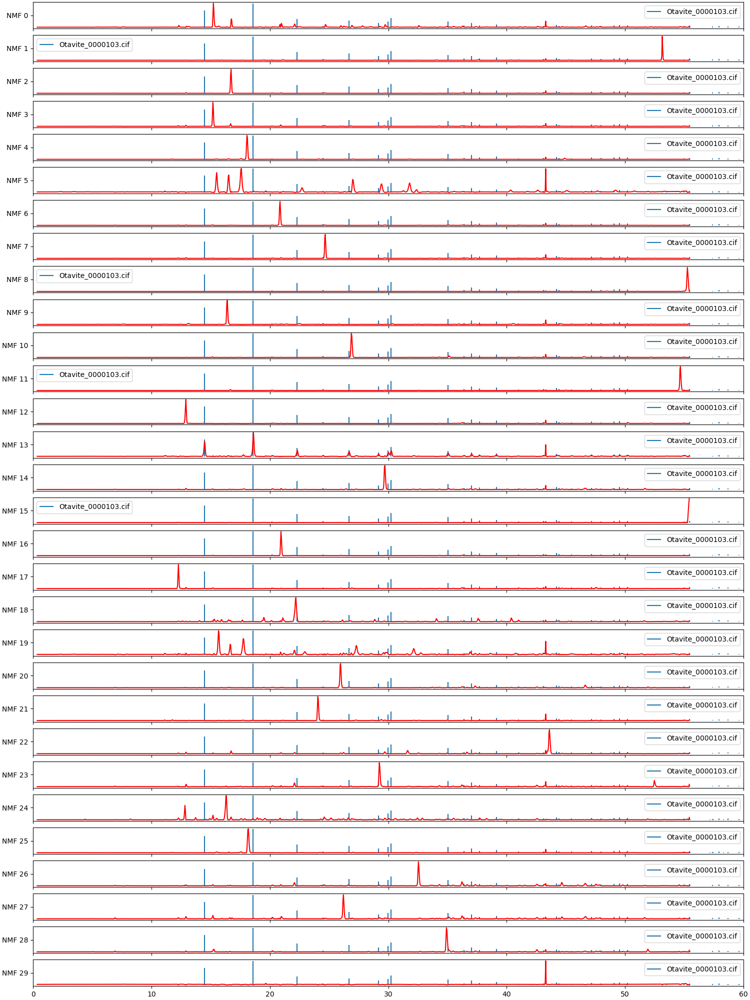

In [182]:
wavelength = 9.510908054342373e-1 # reported in json AND CONVERTED TO Angstroms!!! 

fig, axs = plt.subplots(nrows=n_W, figsize=[15, 20], layout='constrained', sharex=True)

axs = axs.flatten()

ptrn = ptrns[0]
cif = cif_nums[0]

for i, [ax, W_i] in enumerate(zip(axs, W)):
    ax.vlines(ptrn.x, np.zeros_like(ptrn.y), ptrn.y, label=f'{cif}')
    ax.plot(x, 100*W_i/W_i.max(), c='r')
    ax.set_xlim(0, 60)
    ax.set_yticks([50])
    ax.set_yticklabels([f'NMF {i}'])
    ax.legend()